# SVR Model : XOM (Full)

####  Importing the libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import style
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
import math
from sklearn.metrics import mean_squared_error
style.use("fivethirtyeight")

# 1. Importing dataset

In [2]:
XOM_partial_ds=pd.read_csv('dataset/XOM.csv')

### 1.1 Remove rows with outliers

In [3]:
open0xom = XOM_partial_ds[XOM_partial_ds['Open'] == 0]
print(open0xom)

#Remove rows with outliers
XOM_partial_ds = XOM_partial_ds.loc[XOM_partial_ds['Date'] > '1969-12-31']

            Date  Open      High       Low     Close   Volume  Dividends  \
0     1962-01-02   0.0  0.101570  0.100822  0.100822   902400        0.0   
1     1962-01-03   0.0  0.102319  0.100822  0.102319  1200000        0.0   
2     1962-01-04   0.0  0.103068  0.102069  0.102569  1088000        0.0   
3     1962-01-05   0.0  0.103068  0.100073  0.100323  1222400        0.0   
4     1962-01-08   0.0  0.101071  0.098825  0.100073  1388800        0.0   
...          ...   ...       ...       ...       ...      ...        ...   
1982  1969-12-24   0.0  0.173276  0.171533  0.173276  1488000        0.0   
1983  1969-12-26   0.0  0.173276  0.171533  0.173276   899200        0.0   
1984  1969-12-29   0.0  0.173276  0.171533  0.171533  1833600        0.0   
1985  1969-12-30   0.0  0.173625  0.171533  0.171533  2534400        0.0   
1986  1969-12-31   0.0  0.173276  0.171533  0.172230  3414400        0.0   

      Stock Splits  
0              0.0  
1              0.0  
2              0.0  
3  

### 1.2 Create Average column

In [4]:
average=(XOM_partial_ds['Open']+XOM_partial_ds['High']+XOM_partial_ds['Low']+XOM_partial_ds['Close'])/4
y=average.values
XOM_partial_ds.insert(8, "Average", average, True)

### 1.3 Drop OHLC column

In [5]:
#Drop columns - Date,Volume,Dividends,Stock Splits 
df=XOM_partial_ds.drop(['Open', 'High', 'Low', 'Close','Dividends','Stock Splits','Volume'], axis=1)
XOM_partial_ds_Ori=df
XOM_partial_ds1=df

In [6]:
df

,Date,Average
1987,1970-01-02,0.172492
1988,1970-01-05,0.174235
1989,1970-01-06,0.175194
1990,1970-01-07,0.174758
1991,1970-01-08,0.174584
...,...,...
15231,2022-07-06,83.320002
15232,2022-07-07,85.845001
15233,2022-07-08,86.315001
15234,2022-07-11,85.322500


In [7]:
#Pick up only 'Average' column
XOM_partial_ds1=df.reset_index()['Average'] 

### 1.4 Dateset Size

In [8]:
XOM_partial_ds1.shape 

(13249,)

# 2. Data Preprocessing

To build a SVR model, we need to separate our stock prices data into a training set and a test set. Besides, we will also normalize our data so that all the values are in the same scale.

### 2.1 MinMaxScaler 

Use the Scikit-Learn MinMaxScaler to normalize all our stock data ranging from 0 to 1. We also reshape our normalized data into a two-dimensional array.

In [9]:
#Use MinMaxScaler to scale the data range to 0 and 1
scaler=MinMaxScaler(feature_range=(0,1))
XOM_partial_ds1=scaler.fit_transform(np.array(XOM_partial_ds1).reshape(-1,1)) #Fit to data, then transform it

#### Exclude 30 days data 

In [10]:
XOM_partial_ds1_Future=XOM_partial_ds1[-30:]
XOM_partial_ds1=XOM_partial_ds1[:-30] #Exclude 30 days

In [11]:
#df1 have already converted to array and have the values between 0 to 1
XOM_partial_ds1

array([[3.12553976e-04],
       [3.29314322e-04],
       [3.38531460e-04],
       ...,
       [8.98334444e-01],
       [9.16480433e-01],
       [9.28473582e-01]])

In [12]:
len(XOM_partial_ds1)

13219

### 2.2 Preparation of Training and Testing set

- We cannot use Cross Validation or Random Seed to split train and test because stock price always depent on previous date.
- Here we will only need the average prices from our dataset to train our (SVR) model. We are going to extract 80% of the average prices from our acquired stock data as our training set.

In [13]:
training_size=int(len(XOM_partial_ds1)*0.8) #Split train into 80%
test_size=len(XOM_partial_ds1)-training_size 
train_data,test_data=XOM_partial_ds1[0:training_size,:],XOM_partial_ds1[training_size:len(XOM_partial_ds1),:1]

#### Training and Testing size 

In [14]:
training_size,test_size

(10575, 2644)

In [15]:
#Convert an array of values into a dataset matrix
def create_dataset(dataset,time_step=1): #timestep default is 1,more better timestep
    dataX,dataY=[],[]
    for i in range(len(dataset)-time_step-1):
        a=dataset[i:(i+time_step),0] #i=0 to 99(X_train) 100..(y_train)
        print(len(a))
        dataX.append(a)
        dataY.append(dataset[i+time_step,0])
        print(f'({i})')
        print(f'DataX \n----------------\n {a}\n')
        print(f'DataY \n----------------\n {dataset[i+time_step,0]}\n')
        print('========================================================')
    return np.array(dataX),np.array(dataY) #Return as array

In [16]:
#Reshape into X=t,t+1,t+2..t+99 and Y=t+100
#Converting independent and dependent feature based on time steps
time_step=100 #Predict based on 100 days
X_train,y_train=create_dataset(train_data,time_step)
X_test,ytest=create_dataset(test_data,time_step)

100
(0)
DataX 
----------------
 [3.12553976e-04 3.29314322e-04 3.38531460e-04 3.34341037e-04
 3.32665086e-04 3.35179674e-04 3.34341857e-04 3.25962451e-04
 3.20096917e-04 3.14231380e-04 3.10879225e-04 3.11717326e-04
 3.12555384e-04 3.07527129e-04 2.98309355e-04 2.80711468e-04
 2.70658228e-04 2.61440250e-04 2.37140502e-04 1.89376367e-04
 1.68428469e-04 1.60886485e-04 1.71780056e-04 1.83510796e-04
 1.80159111e-04 1.49992096e-04 1.39937148e-04 1.02229182e-04
 8.21199783e-05 6.70360662e-05 4.94394062e-05 8.37911758e-06
 0.00000000e+00 4.60880619e-05 9.88787088e-05 1.08933895e-04
 1.39100957e-04 1.25692190e-04 1.18989614e-04 1.08933576e-04
 1.01392330e-04 8.46323720e-05 8.71474953e-05 9.80403249e-05
 8.96611813e-05 7.87678186e-05 8.46341338e-05 1.19828126e-04
 1.18151435e-04 1.15637340e-04 1.12284144e-04 1.13122039e-04
 1.27368779e-04 1.31558461e-04 1.30719895e-04 1.32396603e-04
 1.46641447e-04 1.75969820e-04 1.91052717e-04 1.96918561e-04
 1.93566648e-04 1.95242727e-04 1.96918723e-04 1.9608

100
(376)
DataX 
----------------
 [0.00079955 0.00080944 0.00082383 0.00082923 0.00083912 0.00084002
 0.00085352 0.0008895  0.00091918 0.00092817 0.00091378 0.00089669
 0.00091648 0.00090928 0.00090119 0.00091018 0.00091738 0.00092368
 0.00093267 0.00093537 0.00091558 0.0008886  0.00085891 0.00085172
 0.00086791 0.00084002 0.00081754 0.00082443 0.0008053  0.00078525
 0.0007807  0.0008053  0.00083901 0.00083172 0.0007643  0.00074334
 0.00073059 0.00070235 0.00069961 0.00071237 0.00074425 0.00076248
 0.00076157 0.00074243 0.00072057 0.00071966 0.00072148 0.00071692
 0.00072877 0.00076065 0.00078981 0.00080894 0.00079436 0.00079345
 0.00077159 0.0007561  0.00075792 0.00075245 0.00074152 0.00071874
 0.00070417 0.00068686 0.00067137 0.00064586 0.00066044 0.00070143
 0.00073514 0.00077068 0.00079892 0.00078343 0.00076612 0.00075883
 0.00072694 0.00072785 0.00073788 0.0007233  0.00070144 0.00070781
 0.00071328 0.00072786 0.00072421 0.0006987  0.00072148 0.00073059
 0.00072512 0.00071055 0.00


DataY 
----------------
 0.001507994638717092

100
(667)
DataX 
----------------
 [0.00108986 0.00110427 0.00113502 0.0011331  0.00110139 0.00107929
 0.00108122 0.00108122 0.00109851 0.0011331  0.00115039 0.00114463
 0.00115039 0.00114367 0.00114943 0.00113022 0.00109371 0.00109947
 0.00110812 0.00111484 0.00110908 0.00111292 0.00110428 0.00108314
 0.00106488 0.00106776 0.00107449 0.00109178 0.00111677 0.00114655
 0.00115616 0.00118594 0.00121957 0.00121189 0.00119747 0.00121284
 0.00121765 0.00120516 0.00119939 0.00119747 0.00118018 0.00118594
 0.00122053 0.00122534 0.00123494 0.00124263 0.00124551 0.0012532
 0.00125608 0.0012359  0.00120804 0.00120996 0.00125512 0.00128452
 0.00129035 0.00131561 0.00132047 0.00130978 0.00131755 0.0013331
 0.00134379 0.00136711 0.00137488 0.0013846  0.00136808 0.00136516
 0.00139431 0.00141958 0.00140986 0.00138848 0.00135545 0.00135933
 0.00138848 0.00138654 0.00138265 0.00138751 0.00139626 0.00140403
 0.00139237 0.00138654 0.00138363 0.00137196 0.0

100
(976)
DataX 
----------------
 [0.00166423 0.00167135 0.00172216 0.0017313  0.00177703 0.00173029
 0.00159209 0.00155753 0.00155042 0.0015301  0.00150469 0.0015616
 0.0015992  0.00157887 0.00154636 0.00153924 0.00152603 0.00149961
 0.00156058 0.00161343 0.00163578 0.00157075 0.0015494  0.00157684
 0.00159615 0.00162969 0.00162156 0.00160428 0.00156262 0.00153416
 0.0015992  0.00165306 0.00170996 0.00171708 0.00175773 0.0018502
 0.00185121 0.00182073 0.00178923 0.00169269 0.00159412 0.00152502
 0.00145287 0.00147116 0.00154636 0.00160733 0.00154229 0.0014488
 0.00148437 0.00151079 0.00147929 0.00147116 0.00143762 0.00143458
 0.00150469 0.00149047 0.00145287 0.00144075 0.0014356  0.00142814
 0.00143972 0.00144692 0.00138722 0.00129766 0.00130178 0.00129458
 0.0013409  0.00137178 0.00135016 0.00139237 0.00145825 0.00143972
 0.00143251 0.00142016 0.00139957 0.00140163 0.00141295 0.00147677
 0.0015128  0.00150663 0.00149839 0.00153545 0.00155192 0.00155295
 0.00156427 0.00156427 0.00151


DataY 
----------------
 0.0015253709024563775

100
(1243)
DataX 
----------------
 [0.00079174 0.00079174 0.00078848 0.00073095 0.00071141 0.00074397
 0.000795   0.00079174 0.00080911 0.00081671 0.00083408 0.00085796
 0.00083191 0.00081671 0.00079065 0.00080151 0.00084059 0.00085579
 0.00084493 0.00087207 0.00093612 0.00097628 0.00097954 0.00096977
 0.00097411 0.00096869 0.00103165 0.00105119 0.00104033 0.00104576
 0.00104142 0.00100668 0.00099474 0.00100668 0.00099908 0.00103708
 0.00106313 0.00114455 0.00118037 0.00119991 0.00120751 0.00117929
 0.00121728 0.00125093 0.00126691 0.00125477 0.0012349  0.0012371
 0.00122717 0.00121172 0.00123821 0.00125477 0.00126691 0.00128898
 0.00137177 0.00139605 0.00136073 0.00133645 0.00134969 0.00137839
 0.0013817  0.00139715 0.00143027 0.00136956 0.00132099 0.00133645
 0.00136073 0.00139274 0.00137839 0.00134417 0.00134859 0.00133093
 0.00127463 0.00120289 0.00122496 0.00122938 0.00117198 0.00116646
 0.00122828 0.00126691 0.00131652 0.00131765 


DataY 
----------------
 0.0024505138316831794

100
(1509)
DataX 
----------------
 [0.00192626 0.00190985 0.00193799 0.00196145 0.00198959 0.00200132
 0.00198608 0.00201539 0.00207169 0.00210335 0.0021057  0.00209983
 0.0021057  0.00210687 0.00210335 0.00206817 0.00207051 0.00205409
 0.00208693 0.00210922 0.00210335 0.00208341 0.00208459 0.0020928
 0.00209279 0.00210921 0.0021057  0.00208811 0.00207403 0.00209866
 0.00214373 0.00215086 0.00211995 0.00208428 0.00204505 0.00203197
 0.00201889 0.00200106 0.0019321  0.00194637 0.00201651 0.00202721
 0.00204742 0.0020605  0.00203672 0.00201651 0.00198204 0.00199392
 0.00201889 0.00203078 0.00201889 0.00199273 0.00199036 0.00199154
 0.00197966 0.00202364 0.00202365 0.00198441 0.00199987 0.00202484
 0.0020284  0.00203435 0.00205931 0.00210449 0.00221506 0.00223884
 0.00221863 0.00218772 0.00217226 0.00219247 0.00222457 0.00221149
 0.00225311 0.00224835 0.0021889  0.0021247  0.00210093 0.00207834
 0.00210806 0.00216869 0.00215918 0.00219842 


DataY 
----------------
 0.003095131734977433

100
(1809)
DataX 
----------------
 [0.00278571 0.00283343 0.00284348 0.00284348 0.0028485  0.00283092
 0.00281334 0.0028259  0.00286106 0.00286106 0.00288115 0.0028485
 0.00281585 0.00279074 0.00277065 0.00274804 0.00268023 0.00266767
 0.00268274 0.00269278 0.002738   0.00273548 0.00272042 0.00274302
 0.00273799 0.0027179  0.00271539 0.00271037 0.00275306 0.00279325
 0.00282841 0.00286859 0.00288115 0.00287613 0.00286608 0.00285101
 0.00286608 0.00283594 0.00276813 0.0027606  0.00278822 0.0028058
 0.00280078 0.0028259  0.00287613 0.00287864 0.00289371 0.00287864
 0.00288111 0.00287347 0.00285054 0.00281742 0.0028378  0.00286073
 0.00286583 0.00288366 0.00290659 0.00291678 0.00288111 0.00284544
 0.00283525 0.00282251 0.00282761 0.00282761 0.00282251 0.00281487
 0.00280978 0.00279194 0.00278175 0.00279704 0.00280723 0.00280213
 0.00283016 0.0028964  0.00292952 0.00291678 0.00290659 0.00290404
 0.00291678 0.00291678 0.00290405 0.00292188 0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



100
(5138)
DataX 
----------------
 [0.03599151 0.0365037  0.03675978 0.03663173 0.03666119 0.03671308
 0.03725788 0.03785461 0.03858099 0.03816592 0.0382697  0.03852914
 0.03826966 0.03837348 0.03847725 0.03808809 0.03793243 0.03749137
 0.03772484 0.0382956  0.03839939 0.03839937 0.03855504 0.03868476
 0.03839942 0.03834748 0.03780269 0.03806216 0.03897014 0.03886638
 0.03847723 0.03834753 0.03826969 0.03795837 0.03816593 0.03865883
 0.03873668 0.03824372 0.03780269 0.03808807 0.03855504 0.03858102
 0.03816588 0.03813997 0.03767298 0.03788051 0.03806214 0.03769892
 0.03798433 0.03904797 0.03943713 0.03920364 0.03891826 0.03884044
 0.03951495 0.03956685 0.03884046 0.03956684 0.04000787 0.039489
 0.03964466 0.04013758 0.04130505 0.04195363 0.04353618 0.04330267
 0.04366586 0.04314615 0.04228045 0.04204432 0.04212306 0.04204438
 0.04249036 0.04241165 0.04235915 0.04230669 0.04280514 0.04270016
 0.04212303 0.0408114  0.04005063 0.04012933 0.04052281 0.04052283
 0.04007686 0.0401818  0.040

(5474)
DataX 
----------------
 [0.05075016 0.05028159 0.04995078 0.04970274 0.05011617 0.05058478
 0.0506399  0.05050207 0.05058477 0.05061234 0.05036426 0.05066744
 0.05113606 0.05083286 0.05099824 0.05097067 0.05050207 0.05086043
 0.05116362 0.05069501 0.05058476 0.05097069 0.05160462 0.05190782
 0.05146684 0.05105335 0.05091556 0.05130142 0.05132901 0.05149436
 0.05163219 0.05196297 0.05234887 0.05210076 0.05221108 0.05270719
 0.0527899  0.0527072  0.05254181 0.0520732  0.05196298 0.05265207
 0.05292772 0.05273476 0.05245915 0.05221102 0.05245913 0.05291119
 0.05296694 0.05288334 0.05263254 0.05246531 0.05260465 0.05224238
 0.05227026 0.05087693 0.05026382 0.05082116 0.05109984 0.05079329
 0.0505425  0.05031958 0.05073756 0.05065397 0.05082113 0.05101626
 0.05123919 0.05054251 0.0499573  0.04965076 0.04920489 0.04881478
 0.04923274 0.04992944 0.05034745 0.05040317 0.05057038 0.05045889
 0.05073756 0.05174077 0.05096052 0.05040316 0.04998517 0.05037529
 0.05076545 0.05213094 0.05224

(5774)
DataX 
----------------
 [0.05371062 0.05382582 0.05353374 0.0532709  0.05359216 0.05353376
 0.05362136 0.05376741 0.05388423 0.05365057 0.05426392 0.05476044
 0.05551981 0.05484806 0.05458518 0.05461439 0.05432235 0.05429315
 0.05397185 0.05347535 0.05341692 0.05408867 0.05467282 0.05490646
 0.05511091 0.05551981 0.05566585 0.05537376 0.055549   0.05584107
 0.05624999 0.05706777 0.05724301 0.05692172 0.05683409 0.05660044
 0.05680489 0.05657124 0.05604554 0.0559579  0.05604554 0.05630841
 0.05648366 0.05642521 0.05543218 0.05525694 0.05496488 0.05496486
 0.0550817  0.05490649 0.05435153 0.05382582 0.05350456 0.05297883
 0.05303724 0.05426391 0.05578267 0.05540297 0.05563662 0.05572424
 0.05601631 0.05651285 0.05680489 0.05751213 0.05709847 0.05760078
 0.05774851 0.05745304 0.05765987 0.05727579 0.05712804 0.05721669
 0.05700982 0.05833947 0.05943268 0.05910771 0.05869405 0.05863495
 0.0586645  0.05890088 0.05928495 0.05940316 0.05937365 0.05904859
 0.05907812 0.0594032  0.05916


DataY 
----------------
 0.05698473334969945

100
(6099)
DataX 
----------------
 [0.0646851  0.0646851  0.06437627 0.06434537 0.06437628 0.06366592
 0.06326445 0.06307912 0.06258497 0.0631409  0.06394388 0.06348061
 0.06304823 0.06332618 0.06329533 0.06301736 0.06280116 0.06301735
 0.06277026 0.06264674 0.06317181 0.06360416 0.06351152 0.06354243
 0.06341884 0.06341887 0.0633571  0.06292469 0.06277027 0.06202906
 0.06085547 0.05921858 0.05915684 0.05906419 0.05906413 0.05912593
 0.05918769 0.05958918 0.05946564 0.06020689 0.06070104 0.06054663
 0.06076279 0.06076281 0.06079371 0.06070102 0.06104074 0.06104077
 0.06033043 0.06026866 0.06011423 0.05928032 0.0588171  0.0586627
 0.05980538 0.06029648 0.06045271 0.06029648 0.06029647 0.0606089
 0.06035899 0.06032774 0.06045268 0.06067142 0.06073389 0.06026522
 0.06020275 0.06004656 0.06014027 0.05992155 0.05979662 0.05942171
 0.05939045 0.05967162 0.06007781 0.05985908 0.06010902 0.06039019
 0.06060892 0.05935919 0.05795328 0.05648486 0.0

DataY 
----------------
 0.07586807322862385

100
(6400)
DataX 
----------------
 [0.07064889 0.07158852 0.07207453 0.07184778 0.07210695 0.07226896
 0.07243092 0.07230033 0.07203833 0.0721366  0.07177639 0.07223482
 0.07288975 0.07318446 0.07282423 0.07203833 0.07197287 0.07252955
 0.07334817 0.0735119  0.07252952 0.07194009 0.07272599 0.0732827
 0.07285697 0.07275877 0.07302077 0.07288975 0.07305349 0.07272599
 0.07249676 0.07259503 0.07246402 0.07298796 0.07390489 0.07400309
 0.07275877 0.07148165 0.07085946 0.07141615 0.07213659 0.072595
 0.07357743 0.07403584 0.07351189 0.07282425 0.07295527 0.07367566
 0.07406859 0.07338094 0.07324993 0.07364287 0.07400308 0.07370838
 0.07397038 0.07406859 0.07429781 0.07524747 0.07524745 0.07528026
 0.07478901 0.07475625 0.0749528  0.07419956 0.07410132 0.07387211
 0.07364291 0.07318444 0.07318443 0.07272601 0.07243127 0.07269327
 0.07288941 0.07245916 0.07239295 0.07226057 0.07192962 0.07159859
 0.07146621 0.07179725 0.07126763 0.07133388 0.071

100
(6743)
DataX 
----------------
 [0.0904263  0.0908045  0.0912859  0.09094205 0.09138904 0.09193925
 0.09207673 0.09176728 0.09214551 0.09290198 0.09317701 0.09386471
 0.09379593 0.09379599 0.09297074 0.09162973 0.09073575 0.09056386
 0.09128586 0.0928676  0.09300509 0.09451804 0.09554957 0.09527446
 0.09396788 0.09317701 0.09352089 0.09448364 0.09486191 0.09455241
 0.09517134 0.09613412 0.09689053 0.09599659 0.09558389 0.09530883
 0.09537762 0.0966155  0.09661547 0.09716561 0.09630596 0.09599658
 0.09592777 0.09609973 0.09589335 0.0965945  0.09746189 0.0983292
 0.09808633 0.09815569 0.09874557 0.09881487 0.09957818 0.10051495
 0.10006389 0.09985573 0.10089656 0.10325568 0.10422711 0.1032557
 0.10325575 0.10339446 0.10398423 0.10308224 0.10367203 0.10360262
 0.10405366 0.10342919 0.10315158 0.10381076 0.10322104 0.10419239
 0.10453935 0.10592713 0.10877196 0.11009031 0.10977812 0.10995159
 0.10991689 0.10974344 0.10956995 0.10832098 0.10734959 0.10859851
 0.10911895 0.10943118 0.109

100
(7074)
DataX 
----------------
 [0.13703815 0.13842972 0.14042806 0.1387154  0.13907215 0.13892951
 0.13471864 0.13553936 0.13607463 0.13279165 0.13061494 0.13493271
 0.13668127 0.13611035 0.13721653 0.13746631 0.13853686 0.13514684
 0.13382655 0.13500414 0.13678837 0.13503982 0.1360746  0.13546795
 0.1369668  0.13710948 0.13835835 0.14010696 0.14076217 0.14086993
 0.14108545 0.14212723 0.14291753 0.14349224 0.14266602 0.14374366
 0.14510875 0.14550385 0.14298934 0.14284567 0.14298938 0.14349228
 0.14439024 0.1449651  0.145468   0.14543209 0.14338446 0.14280975
 0.14266604 0.14385151 0.14550393 0.14507279 0.14600676 0.14629414
 0.14410291 0.14546798 0.14744368 0.15078454 0.15710673 0.15595725
 0.15559798 0.15523883 0.15473589 0.15423298 0.15487958 0.15559802
 0.15796887 0.15829219 0.15725039 0.15505915 0.15225722 0.15157472
 0.1533708  0.15319116 0.15541841 0.158831   0.16292614 0.16605143
 0.16669791 0.16698541 0.16712895 0.16856592 0.16824258 0.16835033
 0.16698541 0.16637469 0.1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




DataY 
----------------
 0.3047193246410374

100
(8941)
DataX 
----------------
 [0.30793364 0.30964785 0.31036879 0.31103535 0.31242309 0.30989268
 0.31257278 0.31521192 0.31613698 0.31680366 0.31989196 0.32337453
 0.32899304 0.3297821  0.32544231 0.32390516 0.32239492 0.31795994
 0.31883072 0.32118422 0.31738868 0.3145589  0.31440929 0.32160587
 0.32429957 0.31971502 0.32266706 0.32254463 0.32447651 0.32389144
 0.3209938  0.31640925 0.31472212 0.31700784 0.31768794 0.31636837
 0.31910271 0.32489824 0.32368749 0.32263996 0.32366028 0.32204125
 0.32153788 0.32277602 0.32250385 0.31884439 0.31575612 0.3188851
 0.32172845 0.32601847 0.32964161 0.33225262 0.3306668  0.32544458
 0.31931986 0.31661304 0.3195113  0.32247799 0.3209878  0.32180803
 0.32091938 0.31982583 0.31994865 0.31903288 0.3231339  0.33211587
 0.33255335 0.33091267 0.33333274 0.33409808 0.33989463 0.34148051
 0.33865053 0.33922482 0.34085175 0.34517163 0.3506537  0.35151492
 0.35419449 0.35454981 0.34964204 0.34973783 0.3


DataY 
----------------
 0.3200924499609034

100
(9108)
DataX 
----------------
 [0.34593753 0.3438901  0.34177393 0.33853112 0.3365251  0.33932821
 0.33446393 0.3311646  0.332394   0.32820846 0.32809801 0.3267442
 0.3282085  0.33005958 0.33268408 0.33530884 0.33233879 0.33019768
 0.33249083 0.33092975 0.32706189 0.3301839  0.33273941 0.33587511
 0.33289129 0.32910643 0.32841565 0.32704815 0.32431308 0.32842966
 0.33110936 0.33474256 0.33761566 0.33797488 0.33447985 0.33430034
 0.33541934 0.33657952 0.33698014 0.33681448 0.33729806 0.33664882
 0.3372288  0.3353778  0.33742219 0.33686967 0.34057174 0.34122101
 0.33974292 0.34046115 0.34224323 0.33981212 0.33796109 0.34094469
 0.34714722 0.35064209 0.35232733 0.35546295 0.35543541 0.35354271
 0.35075248 0.34167684 0.34630445 0.3501724  0.35377769 0.35275546
 0.35004804 0.35111167 0.35031047 0.35109785 0.35174611 0.35277341
 0.34748393 0.34204171 0.34340216 0.33644677 0.33323968 0.33308701
 0.33421166 0.33684927 0.33205961 0.33844584 0.3


DataY 
----------------
 0.4023956783768395

100
(9246)
DataX 
----------------
 [0.37819722 0.37584003 0.38126568 0.38703996 0.38853238 0.38776527
 0.39051284 0.39296765 0.38932733 0.38614723 0.38218612 0.3774441
 0.37769517 0.37846211 0.37696969 0.37465446 0.37415248 0.36452851
 0.36060915 0.36217131 0.36112527 0.36023263 0.36491908 0.36645324
 0.36076268 0.35950743 0.3610555  0.35987004 0.36493294 0.37158601
 0.37429183 0.37348291 0.37377577 0.36625787 0.36645327 0.37418034
 0.37334332 0.37342707 0.37083277 0.37060968 0.37404084 0.3795361
 0.38441779 0.38646803 0.3856035  0.38738873 0.38766754 0.38557548
 0.38830929 0.39126619 0.39840729 0.39801673 0.39487853 0.39420894
 0.39568748 0.39433438 0.39938368 0.40316346 0.40426543 0.40744536
 0.41505908 0.41584361 0.41504491 0.41510104 0.41571747 0.41217335
 0.40484715 0.40564546 0.40794288 0.40710248 0.40341826 0.40500121
 0.41008608 0.42021392 0.4282126  0.42910915 0.43189668 0.43593096
 0.43091609 0.42448637 0.42388421 0.42067624 0.42


DataY 
----------------
 0.4829365730478024

100
(9385)
DataX 
----------------
 [0.40293339 0.40148444 0.39785494 0.39476003 0.39505545 0.39682791
 0.39398634 0.39608244 0.40118896 0.40784308 0.41545369 0.42033524
 0.42224837 0.42357075 0.42516039 0.4262156  0.42487904 0.42517456
 0.42842432 0.43046395 0.43265847 0.43189906 0.43330579 0.43295403
 0.43237712 0.43427634 0.43625994 0.43948133 0.43831372 0.43552843
 0.44311093 0.44569924 0.4424216  0.44561511 0.45024322 0.45055276
 0.44873799 0.44629027 0.44771117 0.45055285 0.4537883  0.4525926
 0.45391523 0.45509646 0.45192435 0.45328077 0.45756168 0.45764649
 0.45654439 0.45994938 0.46603874 0.47143592 0.46918956 0.46831341
 0.46657569 0.46844073 0.4664344  0.46805908 0.47116754 0.47265113
 0.47396509 0.47402129 0.47222716 0.46714065 0.46261971 0.46762128
 0.46493685 0.46690084 0.47427567 0.48255506 0.48593174 0.48491451
 0.47536361 0.47260863 0.46917538 0.46579862 0.46363695 0.46372176
 0.47193044 0.47348439 0.47681865 0.47994111 0.4


DataY 
----------------
 0.49187492653605946

100
(9514)
DataX 
----------------
 [0.4865178  0.49444737 0.499852   0.50125609 0.50335566 0.5128168
 0.52263284 0.52205121 0.52444853 0.52013628 0.51613629 0.5221648
 0.52470387 0.52561192 0.52718629 0.52386688 0.51691649 0.51532759
 0.51619323 0.51251881 0.51985271 0.52356921 0.52803732 0.52807979
 0.53522893 0.53649162 0.53552695 0.53636393 0.52859037 0.51417877
 0.51671758 0.51759711 0.51948384 0.5225905  0.52708715 0.52068942
 0.51800859 0.50545504 0.49890147 0.49436224 0.5042066  0.50309612
 0.50429242 0.49890955 0.48412827 0.48509652 0.49442404 0.48382908
 0.4842707  0.48021229 0.49206007 0.49755659 0.49802645 0.4942813
 0.48593687 0.49574815 0.50140158 0.50412167 0.50437774 0.50110237
 0.50843609 0.51487262 0.51915901 0.52257667 0.51925874 0.522192
 0.52229164 0.52185053 0.51249457 0.51517173 0.51831878 0.52098161
 0.52901311 0.53194657 0.53569185 0.53569181 0.53646065 0.53517928
 0.53264433 0.53399715 0.52775991 0.52143735 0.5164


100
(9638)
DataX 
----------------
 [0.4716219  0.48615211 0.49275949 0.49174404 0.49391798 0.48485059
 0.49873743 0.49218734 0.48110374 0.48935563 0.4880114  0.48977044
 0.49433259 0.48969876 0.48666715 0.48937007 0.50089704 0.50422944
 0.5064032  0.50904904 0.50823382 0.51162321 0.5102646  0.50744729
 0.50914903 0.51551322 0.52430863 0.53045835 0.53459162 0.53655094
 0.53815278 0.53675118 0.53040113 0.52892825 0.52931432 0.52729788
 0.53067313 0.51140868 0.5125243  0.51210961 0.51170935 0.51027899
 0.5097925  0.50970604 0.50818317 0.51154483 0.51629976 0.51996295
 0.52885534 0.53684253 0.54143947 0.54149672 0.53444342 0.52580964
 0.51438917 0.51440346 0.51437484 0.51095591 0.50436199 0.49750962
 0.4910741  0.50286821 0.50683286 0.50571244 0.50499411 0.50802531
 0.50186243 0.50088574 0.50572675 0.50569814 0.50398839 0.49789748
 0.49054252 0.49511053 0.49970744 0.50044032 0.499995   0.49723683
 0.50137419 0.50334225 0.50543937 0.50528126 0.50154643 0.49241
 0.48963744 0.48733903 0.490


100
(9760)
DataX 
----------------
 [0.44846753 0.44718241 0.44316836 0.43571781 0.44204226 0.43121316
 0.42961036 0.43108315 0.44081504 0.43086649 0.42702587 0.43877908
 0.44097383 0.46115926 0.4598453  0.45252494 0.44986809 0.45926786
 0.45971551 0.44198456 0.44201333 0.44615725 0.44787564 0.4536078
 0.43788387 0.44468467 0.43938547 0.41957544 0.35787817 0.39658883
 0.4200952  0.38157228 0.3763888  0.39302228 0.41752513 0.41375669
 0.38355057 0.3900191  0.38565856 0.38799764 0.41195165 0.43264254
 0.42783458 0.43052003 0.42520655 0.43997759 0.43199283 0.41212492
 0.42051462 0.43105748 0.42131328 0.40700933 0.41832199 0.43014266
 0.42899544 0.43409253 0.4340199  0.41117706 0.42115352 0.45051678
 0.45315971 0.45737108 0.46284589 0.44083076 0.44321227 0.44920999
 0.44568098 0.43856527 0.45818444 0.45516385 0.46316536 0.465794
 0.45947668 0.46572121 0.47389707 0.47487004 0.45571565 0.44181825
 0.43323578 0.43645965 0.43569005 0.44399631 0.45164946 0.45375511
 0.45918644 0.46728935 0.472


DataY 
----------------
 0.4032354966712721

100
(9882)
DataX 
----------------
 [0.41763427 0.40121483 0.38422613 0.37870933 0.38187649 0.36806952
 0.36858044 0.37272552 0.38659063 0.3875539  0.38742252 0.39066266
 0.39098368 0.39490973 0.3993468  0.40308307 0.39248702 0.40030987
 0.40559339 0.40700911 0.4120153  0.40719904 0.39797479 0.39887974
 0.39600454 0.40998641 0.40788487 0.40607511 0.40004727 0.40003271
 0.40651278 0.39779965 0.39158213 0.39485146 0.3948368  0.39159665
 0.38237273 0.3820224  0.37927843 0.37999375 0.38643016 0.38267906
 0.38619655 0.39490969 0.39311458 0.39166977 0.39750776 0.39448659
 0.39660289 0.39941975 0.40851243 0.40568742 0.41172174 0.40938728
 0.40235455 0.40499727 0.41048849 0.41273473 0.41173648 0.4010625
 0.40317668 0.40396965 0.40518807 0.40344101 0.40733174 0.41637593
 0.42298292 0.42186714 0.4255672  0.427006   0.42640381 0.42865025
 0.43143982 0.43324581 0.43099933 0.42540563 0.42440708 0.41724218
 0.4184462  0.417565   0.40652429 0.40443934 0.4


DataY 
----------------
 0.3972129635206327

100
(10042)
DataX 
----------------
 [0.42010925 0.42550091 0.42926779 0.43256197 0.4304347  0.43112906
 0.43460038 0.43471848 0.43455606 0.4366536  0.43761381 0.43092235
 0.42690418 0.42439314 0.42189675 0.422517   0.42523503 0.42495435
 0.43165518 0.43064489 0.43236837 0.42854997 0.42865402 0.43856417
 0.4435117  0.44532435 0.44196661 0.44082259 0.44798407 0.44804352
 0.45132699 0.44327401 0.44328895 0.44969264 0.44945505 0.44623084
 0.44412096 0.43848978 0.43299239 0.43167002 0.43174449 0.43129885
 0.41626258 0.41180533 0.40877434 0.40511907 0.40458426 0.40568372
 0.40709528 0.4057432  0.40563924 0.40875932 0.40920512 0.40699129
 0.40575805 0.40771954 0.41000745 0.41379615 0.41345451 0.41196859
 0.41528202 0.41345438 0.41308302 0.41216188 0.41036395 0.40840284
 0.4045398  0.39902754 0.39351523 0.39216314 0.39060324 0.38831509
 0.38678465 0.38409541 0.39046947 0.39577367 0.39575879 0.38795848
 0.38192619 0.38611652 0.38834464 0.38644547 0


DataY 
----------------
 0.40059198948419

100
(10200)
DataX 
----------------
 [0.36047203 0.36813578 0.36092366 0.35833418 0.36253477 0.36456744
 0.36986718 0.37000263 0.37086086 0.37274294 0.37355598 0.37456479
 0.37754587 0.3819574  0.37515202 0.36899389 0.36295639 0.35788234
 0.35344077 0.34552104 0.34351868 0.34047719 0.3394534  0.34342829
 0.34722247 0.35288367 0.35225129 0.35152866 0.35666278 0.35464524
 0.35505182 0.35054997 0.35036925 0.34990246 0.35101675 0.35479577
 0.35637666 0.36024614 0.36410068 0.36548576 0.36592243 0.35991496
 0.36787983 0.37441413 0.37617572 0.37438399 0.37150817 0.37485081
 0.37114696 0.36532042 0.36266684 0.36277295 0.36104424 0.3665488
 0.36436529 0.35983115 0.35581268 0.35867877 0.35673773 0.35564587
 0.35602497 0.35732926 0.3586787  0.35637375 0.36506274 0.36710991
 0.36997593 0.36707952 0.3675951  0.37024894 0.37018816 0.36933901
 0.36856555 0.36736768 0.36753448 0.36850499 0.37071895 0.37220498
 0.37232623 0.36958159 0.37282678 0.37390336 0.37


DataY 
----------------
 0.5078017818005369

100
(10336)
DataX 
----------------
 [0.43941011 0.43785341 0.43818924 0.43881489 0.43941    0.44171416
 0.44330122 0.44449144 0.44412517 0.44597163 0.44699404 0.44607839
 0.44546809 0.45140392 0.4548832  0.45396749 0.45671436 0.45917113
 0.45660747 0.45886585 0.4637795  0.46583952 0.47018839 0.47638377
 0.47769616 0.47270632 0.47833698 0.47888624 0.4775282  0.48195361
 0.48549363 0.48318956 0.48761485 0.50229438 0.50868822 0.50604822
 0.5066433  0.50945118 0.50912118 0.5041664  0.5045651  0.50593021
 0.51097719 0.51303269 0.51019496 0.51234253 0.51470479 0.52303442
 0.53059698 0.52966131 0.52429244 0.52550412 0.52390888 0.51797231
 0.52370957 0.52281972 0.52225211 0.51723583 0.5150117  0.50514801
 0.49896622 0.50203396 0.49474744 0.49129624 0.49454805 0.49842933
 0.50471861 0.50674343 0.5052555  0.50721911 0.51002618 0.51221969
 0.50933597 0.51508845 0.51714396 0.51777279 0.51734329 0.52113237
 0.52291158 0.52269695 0.52562687 0.52334127 0

100
(0)
DataX 
----------------
 [0.46645071 0.46340474 0.47279293 0.47819809 0.49503781 0.49808414
 0.49986497 0.50214566 0.50381714 0.50462932 0.50013032 0.50487912
 0.50022409 0.50336405 0.4951941  0.49906826 0.50117706 0.49792783
 0.50676961 0.51490807 0.52349986 0.52812386 0.53107633 0.5278738
 0.52787396 0.52943604 0.5368718  0.53455969 0.53332562 0.53313838
 0.53151362 0.53505986 0.5298578  0.52663983 0.52631173 0.53441911
 0.53479414 0.53974616 0.54349527 0.54530728 0.54249519 0.54099587
 0.54326093 0.53655936 0.53110756 0.52581175 0.52374995 0.5225003
 0.52698346 0.53127931 0.53437256 0.53598508 0.53358199 0.52525755
 0.52836719 0.5289957  0.52924697 0.53199558 0.53697479 0.54121564
 0.5447183  0.54405846 0.54712142 0.54680712 0.54581763 0.54470244
 0.54350888 0.54146686 0.54239369 0.53896947 0.53763438 0.5325769
 0.53039353 0.53257683 0.54099551 0.54082284 0.53807414 0.54124685
 0.54255065 0.5428647  0.54047744 0.5355925  0.53568679 0.5429434
 0.54454541 0.53871817 0.53651934


DataY 
----------------
 0.5760844704816641

100
(188)
DataX 
----------------
 [0.55557103 0.55647843 0.55835649 0.55814978 0.55880223 0.55471152
 0.55561864 0.55327883 0.55507756 0.56211331 0.56924434 0.56962661
 0.5698971  0.56929227 0.57476806 0.58355466 0.58423884 0.58236074
 0.57865176 0.57717151 0.5841435  0.58236076 0.58436642 0.58138988
 0.58294982 0.58046633 0.58393672 0.58331584 0.58177158 0.58562385
 0.58820266 0.58719993 0.58829819 0.58048229 0.58091203 0.57928847
 0.57979786 0.58530553 0.59105181 0.59237302 0.5894282  0.5831566
 0.5759937  0.57285776 0.57414702 0.57529316 0.57761705 0.57761733
 0.57811056 0.57357401 0.5800528  0.56945314 0.56054755 0.55667117
 0.55803285 0.555502   0.55255473 0.54991191 0.55023209 0.55984279
 0.55872155 0.5613802  0.56637778 0.56503237 0.56171681 0.55782458
 0.56376698 0.56315833 0.56280593 0.55883366 0.55985855 0.56096387
 0.56435969 0.56596136 0.56805973 0.5717918  0.56801163 0.56319042
 0.56610533 0.56985358 0.56882857 0.56597739 0.56


DataY 
----------------
 0.6160774843047432

100
(316)
DataX 
----------------
 [0.57429293 0.57218096 0.57659784 0.57600141 0.57377688 0.57181044
 0.57293869 0.5749859  0.57350303 0.57664623 0.57408315 0.57163273
 0.57023063 0.57105262 0.56740958 0.57139128 0.5742605  0.57767796
 0.57953175 0.5817401  0.58198196 0.58278794 0.58101477 0.57803236
 0.57127834 0.57085928 0.57153601 0.57008553 0.57198757 0.57166522
 0.56239628 0.55820523 0.55267623 0.55601284 0.56065544 0.56495936
 0.57110085 0.57593715 0.56850579 0.56557198 0.56818349 0.56929561
 0.56663593 0.56798986 0.57595303 0.5816112  0.58390012 0.58804291
 0.59015624 0.58582217 0.58212167 0.58699084 0.58884157 0.58832211
 0.59148712 0.59642141 0.60129069 0.59974889 0.59445739 0.59220128
 0.59963517 0.59572356 0.59651895 0.59150346 0.58944184 0.58895499
 0.58470258 0.58121263 0.59001002 0.59249328 0.58640678 0.58587112
 0.58668281 0.58838706 0.59112999 0.59371086 0.59281814 0.58070956
 0.580109   0.57478531 0.57777172 0.57960571 0.5


DataY 
----------------
 0.6245341291789722

100
(471)
DataX 
----------------
 [0.55823969 0.56299557 0.56799667 0.56819289 0.56964745 0.56923894
 0.57113468 0.5694024  0.571576   0.57023565 0.57574356 0.57504101
 0.57415832 0.5786039  0.58040139 0.58576205 0.58353929 0.59416269
 0.59980122 0.60506387 0.60639288 0.60555347 0.61001265 0.60938737
 0.60685345 0.6107696  0.62186008 0.62803085 0.62684583 0.62516748
 0.62320939 0.62283098 0.6253815  0.62060974 0.6174504  0.61513011
 0.61364902 0.61685796 0.62011599 0.6186185  0.62544735 0.62992306
 0.62883681 0.62284729 0.62396638 0.62561186 0.63793636 0.63533651
 0.64685479 0.6527787  0.65070526 0.64892801 0.64914218 0.65804384
 0.66586004 0.66293115 0.66261843 0.65766572 0.65452282 0.65458854
 0.65901482 0.6622235  0.6558226  0.65727047 0.65162661 0.64999778
 0.65012946 0.64864839 0.65248225 0.64697001 0.64622971 0.63647198
 0.62738886 0.62447642 0.62671435 0.62539795 0.61735155 0.60746238
 0.59747415 0.59171538 0.59082652 0.59313155 0.5


DataY 
----------------
 0.635911357431024

100
(614)
DataX 
----------------
 [0.68216887 0.67951758 0.67785034 0.68008602 0.68133724 0.68175433
 0.67523088 0.67042606 0.67070965 0.6708264  0.6757149  0.67726656
 0.6761318  0.6756816  0.6750307  0.67514764 0.67075981 0.66770666
 0.66643847 0.66712255 0.66840746 0.67341236 0.67621523 0.67546462
 0.67679927 0.68041972 0.68080338 0.68420688 0.68108705 0.68320583
 0.68228815 0.68954563 0.69433412 0.6891119  0.680403   0.67801725
 0.67489723 0.67214447 0.67416337 0.67501412 0.68183786 0.68210471
 0.68362291 0.6877104  0.68362285 0.67928484 0.68283884 0.68145391
 0.68712652 0.68580844 0.68308906 0.68383985 0.69081358 0.69248199
 0.6949846  0.68946231 0.69104731 0.69276558 0.68886157 0.66905807
 0.65791309 0.66201751 0.65766286 0.65771313 0.65851387 0.66043249
 0.66388356 0.65924661 0.66343008 0.66405167 0.66366506 0.66633609
 0.66791526 0.66761295 0.66798246 0.66132979 0.66218646 0.66744493
 0.66789854 0.66621842 0.66600017 0.6627914  0.66


DataY 
----------------
 0.5964933907330812

100
(770)
DataX 
----------------
 [0.59649994 0.60966496 0.61983447 0.6288198  0.63546965 0.63359169
 0.63193331 0.63007191 0.62760134 0.6248433  0.6246399  0.61507947
 0.6086326  0.61264288 0.61924224 0.62228806 0.61243983 0.61022317
 0.60078106 0.60538371 0.60827707 0.61524897 0.61900534 0.62384494
 0.61871769 0.61590875 0.61524899 0.60372544 0.59105129 0.58962995
 0.59854756 0.61846391 0.61777003 0.62303273 0.62406695 0.6234703
 0.6205721  0.61451954 0.62520918 0.63252304 0.63143186 0.62157796
 0.60913208 0.60918336 0.60654104 0.6084162  0.60891057 0.60394939
 0.60396652 0.59919293 0.5965502  0.59540797 0.59112881 0.58505977
 0.58304795 0.57634768 0.574694   0.57392675 0.56915325 0.57251166
 0.57402914 0.57730252 0.57733645 0.57660331 0.58042219 0.57847887
 0.57873439 0.57708075 0.56978397 0.57825735 0.57771151 0.57902441
 0.57350059 0.57851298 0.58118953 0.57793328 0.57351767 0.58127455
 0.58299664 0.58724178 0.59687439 0.59685729 0.59


DataY 
----------------
 0.5510766679814891

100
(878)
DataX 
----------------
 [0.58789849 0.58494186 0.58415114 0.58440896 0.58422007 0.58440897
 0.58461546 0.5789599  0.57861615 0.57995683 0.58274171 0.58657478
 0.58478717 0.57818646 0.57351094 0.57732691 0.58189933 0.58475289
 0.58401352 0.58504496 0.58337755 0.58236348 0.57890839 0.57498905
 0.56955715 0.57388879 0.56813045 0.56893835 0.56613639 0.56553478
 0.56438313 0.56453776 0.56336899 0.56455494 0.5677521  0.56795847
 0.56998677 0.56548336 0.56233761 0.56152956 0.5628016  0.55871059
 0.55212689 0.54458058 0.55632108 0.56665213 0.56923057 0.55126738
 0.53724049 0.53254769 0.53182574 0.53187754 0.52976311 0.53442142
 0.53461101 0.54009375 0.54437937 0.54437935 0.54229726 0.54116938
 0.53174819 0.52145926 0.50735322 0.47516823 0.4838782  0.49319529
 0.51318317 0.51946407 0.51634098 0.50223496 0.5044732  0.51167376
 0.50317189 0.50860267 0.50685029 0.50200937 0.50150625 0.50032652
 0.5035883  0.51202081 0.51602863 0.50462936 0.5


DataY 
----------------
 0.6488081741414741

100
(1049)
DataX 
----------------
 [0.53704311 0.53889809 0.53277268 0.52011871 0.53560781 0.55165695
 0.55547215 0.56072287 0.562769   0.5635284  0.55614621 0.56730781
 0.57271187 0.57719786 0.58193079 0.57818674 0.58238997 0.57521966
 0.56886198 0.57378932 0.58041194 0.5717052  0.57073406 0.57559063
 0.58025314 0.58088881 0.58752899 0.5873173  0.58447401 0.57825744
 0.5831317  0.57712707 0.579317   0.58320243 0.5906023  0.59318069
 0.59046091 0.590408   0.59104357 0.58830647 0.59259774 0.59199732
 0.596642   0.59266832 0.58346724 0.58657551 0.58134797 0.58456219
 0.58207198 0.58641655 0.58881843 0.59212089 0.59607678 0.6010395
 0.60036837 0.59994474 0.60545489 0.61048792 0.61287202 0.61541527
 0.61354334 0.61744623 0.62111976 0.6206074  0.62489909 0.62548185
 0.6211902  0.6213314  0.62276206 0.62050158 0.62235598 0.6303913
 0.63331424 0.63719677 0.63285141 0.63521996 0.63598561 0.63586116
 0.63502408 0.63961875 0.63500622 0.63890643 0.63


DataY 
----------------
 0.6154023564776732

100
(1199)
DataX 
----------------
 [0.62317233 0.62098104 0.62611793 0.63215282 0.63362566 0.63628375
 0.62900958 0.62442947 0.61510789 0.60885746 0.60918085 0.6042056
 0.60364872 0.59632071 0.5950457  0.60169105 0.59680585 0.59856594
 0.59398587 0.61099477 0.62065773 0.62473507 0.62320827 0.62225621
 0.62315429 0.62405249 0.62281304 0.63116514 0.6296382  0.62502236
 0.6186822  0.62324425 0.61988556 0.62306469 0.62565083 0.62387277
 0.61931071 0.62196882 0.62304659 0.6214301  0.62487849 0.61033033
 0.5996077  0.59915848 0.59777575 0.5990329  0.59906874 0.60898342
 0.61538402 0.61594578 0.62670916 0.62165356 0.6157466  0.62455288
 0.62352009 0.62120065 0.61648951 0.62516883 0.62665484 0.62714393
 0.62834001 0.62727088 0.61922555 0.63337726 0.63459119 0.63071361
 0.63214495 0.63176436 0.63475437 0.63805218 0.64158551 0.65597277
 0.66702589 0.66053891 0.65410656 0.66004973 0.65738619 0.65474067
 0.65466802 0.65425144 0.65655267 0.65689691 0.6

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




DataY 
----------------
 0.3426567246857267

100
(2013)
DataX 
----------------
 [0.56609395 0.56344593 0.56307647 0.55903257 0.56145476 0.55628186
 0.56069529 0.56209111 0.56705879 0.56876254 0.56843411 0.56547819
 0.57050726 0.5721291  0.5727038  0.57208797 0.57151327 0.57069212
 0.57223162 0.57338121 0.57502355 0.5751261  0.57399696 0.57221118
 0.56851628 0.57834887 0.57999108 0.57912892 0.57510551 0.57095902
 0.56814668 0.56962467 0.56927577 0.56736668 0.56679187 0.56623772
 0.56250174 0.55677453 0.55176584 0.54562816 0.5438218  0.53357852
 0.53152579 0.52861089 0.52596283 0.51262006 0.49931826 0.49792242
 0.50570231 0.51101891 0.50280795 0.49959306 0.50290377 0.50817177
 0.50665171 0.50513176 0.49811467 0.50025937 0.49911417 0.49201383
 0.47369032 0.46021846 0.44697556 0.42294681 0.41438891 0.4390215
 0.43671028 0.43227507 0.41565902 0.39997997 0.35042333 0.36780982
 0.35179756 0.32083503 0.31779507 0.29020575 0.29766005 0.28102314
 0.28060673 0.2783371  0.26265805 0.28883146 0.3

(2193)
DataX 
----------------
 [0.37375513 0.36983741 0.36975091 0.36769465 0.36410164 0.35838743
 0.35440488 0.36033553 0.35646115 0.34819293 0.34356093 0.34758683
 0.34756522 0.34059564 0.33866928 0.33895065 0.33843123 0.32864778
 0.32994648 0.32449203 0.31862637 0.31698138 0.31609396 0.32048787
 0.32353972 0.32167824 0.31304205 0.31098579 0.30206824 0.29583459
 0.29618092 0.30481714 0.29817224 0.29739301 0.28860534 0.28174396
 0.28864863 0.29137583 0.28888673 0.2978692  0.30388639 0.29763111
 0.29717655 0.29533678 0.29276102 0.29516362 0.29146238 0.29003387
 0.28745815 0.29306412 0.29750125 0.28799925 0.28408157 0.2747744
 0.27704707 0.28042363 0.2890382  0.29198185 0.28689539 0.28782609
 0.2847093  0.31773896 0.32521567 0.32424026 0.31397709 0.3158834
 0.33341738 0.3368532  0.3368311  0.32743235 0.32778699 0.33906989
 0.36394103 0.3640519  0.35709154 0.34396872 0.34352549 0.34687258
 0.35476397 0.3640962  0.36336474 0.36617992 0.37908097 0.38533204
 0.38577535 0.38258338 0.3771747


DataY 
----------------
 0.5056157394290919

100
(2365)
DataX 
----------------
 [0.49670227 0.49972304 0.4990242  0.50109815 0.50556174 0.51775761
 0.52952519 0.52080099 0.5251067  0.53112576 0.54237486 0.54888982
 0.55506669 0.56757821 0.55096385 0.55095907 0.54185615 0.55102769
 0.55994765 0.55930726 0.53924877 0.53654995 0.54075833 0.54112424
 0.53709886 0.53433135 0.53730471 0.53387396 0.54771128 0.55482437
 0.55555629 0.55990188 0.55930723 0.56308104 0.5725728  0.57636951
 0.5716122  0.56751817 0.57858802 0.5859527  0.57405942 0.55487015
 0.56385867 0.57703277 0.58551819 0.5865474  0.59002383 0.58160708
 0.57545461 0.57378499 0.58137836 0.57483708 0.56536822 0.55448132
 0.54668208 0.5558536  0.5550073  0.55649401 0.55166808 0.53977484
 0.53135803 0.50592475 0.5088981  0.52413063 0.52296417 0.52033394
 0.52765284 0.52712681 0.53035168 0.53801367 0.53076336 0.528339
 0.52724119 0.52177483 0.52209503 0.52726402 0.52168334 0.52758423
 0.53101498 0.53129469 0.52609387 0.51715499 0.51

In [17]:
print(len(X_train))

10474


In [18]:
print(scaler.inverse_transform(X_train).reshape(-1,1))

[[ 0.17249176]
 [ 0.17423513]
 [ 0.17519387]
 ...
 [51.07038144]
 [50.77953444]
 [50.68203174]]


#### Training Shape

Set apart the first 80% of the stock data as the training set.

In [19]:
print(f'x_train shape : {X_train.shape}')
print(f'y_train shape : {y_train.shape}')

x_train shape : (10474, 100)
y_train shape : (10474,)


#### Testing Shape

Extract last 20% of the dataset.

In [20]:
print(f'X_test shape : {X_test.shape}')
print(f'y_test shape : {ytest.shape}')

X_test shape : (2543, 100)
y_test shape : (2543,)


# 3. Modelling

Support vector regression (SVR) analysis is used as a machine learning technique in this study to predict stock market price as well as stock market trend. Support vector regression is a powerful machine learning technique for identifying patterns in time series datasets. It can produce good prediction results if the values of important parameters are correctly determined.

### 3.1 Create the SVR model

In [21]:
# create the model object
model = SVR(C=5, degree=2, gamma=0.001, kernel='linear')

### 3.2 Training SVR Model

In [22]:
model.fit(X_train, y_train)

SVR(C=5, degree=2, gamma=0.001, kernel='linear')

####  Hyperparameter tuning

SVR also has some hyper-parameters (like what C or gamma values to use) and finding optimal hyper-parameter is a very hard task to solve. Instead of doing it manually, we'll be using the Scikit-learn built-in functionality named GridSearchCV.
GridSearchCV takes a dictionary that describes the parameters that could be tried on a model to train it. So now we'll be tuning the hyperparameters in order to obtain a high-accuracy model that fits the dataset well.

In [23]:
# defining parameter range
param_grid = {'C': [5,10,20,50,100,200,500,1000], 
              'gamma': [0.001,0.01,0.1,0.5,0.8,1,3],
              'degree':[2,3],
              'kernel': ['rbf','linear','poly']} 
  
grid = GridSearchCV(model, param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 5 folds for each of 336 candidates, totalling 1680 fits
[CV 1/5] END C=5, degree=2, gamma=0.001, kernel=rbf;, score=-15527.265 total time=   0.0s
[CV 2/5] END C=5, degree=2, gamma=0.001, kernel=rbf;, score=-339.933 total time=   0.0s
[CV 3/5] END C=5, degree=2, gamma=0.001, kernel=rbf;, score=-48.700 total time=   0.0s
[CV 4/5] END C=5, degree=2, gamma=0.001, kernel=rbf;, score=-0.676 total time=   0.0s
[CV 5/5] END C=5, degree=2, gamma=0.001, kernel=rbf;, score=-5.737 total time=   0.0s
[CV 1/5] END C=5, degree=2, gamma=0.001, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=5, degree=2, gamma=0.001, kernel=linear;, score=-340.538 total time=   0.0s
[CV 3/5] END C=5, degree=2, gamma=0.001, kernel=linear;, score=-49.184 total time=   0.0s
[CV 4/5] END C=5, degree=2, gamma=0.001, kernel=linear;, score=-0.727 total time=   0.0s
[CV 5/5] END C=5, degree=2, gamma=0.001, kernel=linear;, score=-5.715 total time=   0.0s
[CV 1/5] END C=5, degree=2, gamma=0.001, kernel

[CV 1/5] END C=5, degree=2, gamma=3, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=5, degree=2, gamma=3, kernel=linear;, score=-340.538 total time=   0.0s
[CV 3/5] END C=5, degree=2, gamma=3, kernel=linear;, score=-49.184 total time=   0.0s
[CV 4/5] END C=5, degree=2, gamma=3, kernel=linear;, score=-0.727 total time=   0.0s
[CV 5/5] END C=5, degree=2, gamma=3, kernel=linear;, score=-5.715 total time=   0.0s
[CV 1/5] END C=5, degree=2, gamma=3, kernel=poly;, score=-16056.047 total time=   0.0s
[CV 2/5] END C=5, degree=2, gamma=3, kernel=poly;, score=-305.280 total time=   0.0s
[CV 3/5] END C=5, degree=2, gamma=3, kernel=poly;, score=-22.623 total time=   0.0s
[CV 4/5] END C=5, degree=2, gamma=3, kernel=poly;, score=0.658 total time=   0.0s
[CV 5/5] END C=5, degree=2, gamma=3, kernel=poly;, score=-2.976 total time=   0.0s
[CV 1/5] END C=5, degree=3, gamma=0.001, kernel=rbf;, score=-15527.265 total time=   0.0s
[CV 2/5] END C=5, degree=3, gamma=0.001, kernel=rbf;, sco

[CV 1/5] END C=5, degree=3, gamma=1, kernel=poly;, score=-16027.104 total time=  36.2s
[CV 2/5] END C=5, degree=3, gamma=1, kernel=poly;, score=-303.231 total time= 1.4min
[CV 3/5] END C=5, degree=3, gamma=1, kernel=poly;, score=-20.283 total time= 1.4min
[CV 4/5] END C=5, degree=3, gamma=1, kernel=poly;, score=-0.328 total time= 1.4min
[CV 5/5] END C=5, degree=3, gamma=1, kernel=poly;, score=0.121 total time=   0.0s
[CV 1/5] END C=5, degree=3, gamma=3, kernel=rbf;, score=-16189.778 total time=   0.0s
[CV 2/5] END C=5, degree=3, gamma=3, kernel=rbf;, score=-289.606 total time=   0.0s
[CV 3/5] END C=5, degree=3, gamma=3, kernel=rbf;, score=-55.710 total time=   0.0s
[CV 4/5] END C=5, degree=3, gamma=3, kernel=rbf;, score=-4.590 total time=   0.0s
[CV 5/5] END C=5, degree=3, gamma=3, kernel=rbf;, score=-8.062 total time=   0.0s
[CV 1/5] END C=5, degree=3, gamma=3, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=5, degree=3, gamma=3, kernel=linear;, score=-340.538 total

[CV 2/5] END C=10, degree=2, gamma=1, kernel=linear;, score=-340.538 total time=   0.0s
[CV 3/5] END C=10, degree=2, gamma=1, kernel=linear;, score=-49.184 total time=   0.0s
[CV 4/5] END C=10, degree=2, gamma=1, kernel=linear;, score=-0.727 total time=   0.0s
[CV 5/5] END C=10, degree=2, gamma=1, kernel=linear;, score=-5.715 total time=   0.0s
[CV 1/5] END C=10, degree=2, gamma=1, kernel=poly;, score=-15957.520 total time=   0.0s
[CV 2/5] END C=10, degree=2, gamma=1, kernel=poly;, score=-303.065 total time=   0.0s
[CV 3/5] END C=10, degree=2, gamma=1, kernel=poly;, score=-22.368 total time=   0.0s
[CV 4/5] END C=10, degree=2, gamma=1, kernel=poly;, score=0.655 total time=   0.0s
[CV 5/5] END C=10, degree=2, gamma=1, kernel=poly;, score=-2.976 total time=   0.0s
[CV 1/5] END C=10, degree=2, gamma=3, kernel=rbf;, score=-16189.778 total time=   0.0s
[CV 2/5] END C=10, degree=2, gamma=3, kernel=rbf;, score=-289.606 total time=   0.0s
[CV 3/5] END C=10, degree=2, gamma=3, kernel=rbf;, scor

[CV 1/5] END C=10, degree=3, gamma=0.8, kernel=poly;, score=-16017.668 total time=  23.9s
[CV 2/5] END C=10, degree=3, gamma=0.8, kernel=poly;, score=-303.569 total time=  57.0s
[CV 3/5] END C=10, degree=3, gamma=0.8, kernel=poly;, score=-20.284 total time=  59.8s
[CV 4/5] END C=10, degree=3, gamma=0.8, kernel=poly;, score=-0.328 total time=  56.8s
[CV 5/5] END C=10, degree=3, gamma=0.8, kernel=poly;, score=0.121 total time=   0.0s
[CV 1/5] END C=10, degree=3, gamma=1, kernel=rbf;, score=-15937.001 total time=   0.0s
[CV 2/5] END C=10, degree=3, gamma=1, kernel=rbf;, score=-305.663 total time=   0.0s
[CV 3/5] END C=10, degree=3, gamma=1, kernel=rbf;, score=-43.361 total time=   0.0s
[CV 4/5] END C=10, degree=3, gamma=1, kernel=rbf;, score=-3.873 total time=   0.0s
[CV 5/5] END C=10, degree=3, gamma=1, kernel=rbf;, score=-8.012 total time=   0.0s
[CV 1/5] END C=10, degree=3, gamma=1, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=10, degree=3, gamma=1, kernel=linear;

[CV 2/5] END C=20, degree=2, gamma=0.8, kernel=rbf;, score=-307.618 total time=   0.0s
[CV 3/5] END C=20, degree=2, gamma=0.8, kernel=rbf;, score=-40.776 total time=   0.0s
[CV 4/5] END C=20, degree=2, gamma=0.8, kernel=rbf;, score=-2.996 total time=   0.0s
[CV 5/5] END C=20, degree=2, gamma=0.8, kernel=rbf;, score=-7.990 total time=   0.0s
[CV 1/5] END C=20, degree=2, gamma=0.8, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=20, degree=2, gamma=0.8, kernel=linear;, score=-340.538 total time=   0.0s
[CV 3/5] END C=20, degree=2, gamma=0.8, kernel=linear;, score=-49.184 total time=   0.0s
[CV 4/5] END C=20, degree=2, gamma=0.8, kernel=linear;, score=-0.727 total time=   0.0s
[CV 5/5] END C=20, degree=2, gamma=0.8, kernel=linear;, score=-5.715 total time=   0.0s
[CV 1/5] END C=20, degree=2, gamma=0.8, kernel=poly;, score=-15960.775 total time=   0.0s
[CV 2/5] END C=20, degree=2, gamma=0.8, kernel=poly;, score=-303.042 total time=   0.0s
[CV 3/5] END C=20, degree=2, gam

[CV 1/5] END C=20, degree=3, gamma=0.5, kernel=poly;, score=-16024.954 total time=  17.7s
[CV 2/5] END C=20, degree=3, gamma=0.5, kernel=poly;, score=-303.734 total time=  36.1s
[CV 3/5] END C=20, degree=3, gamma=0.5, kernel=poly;, score=-20.327 total time=  37.3s
[CV 4/5] END C=20, degree=3, gamma=0.5, kernel=poly;, score=-0.330 total time=  35.5s
[CV 5/5] END C=20, degree=3, gamma=0.5, kernel=poly;, score=0.121 total time=   0.0s
[CV 1/5] END C=20, degree=3, gamma=0.8, kernel=rbf;, score=-15913.352 total time=   0.0s
[CV 2/5] END C=20, degree=3, gamma=0.8, kernel=rbf;, score=-307.618 total time=   0.0s
[CV 3/5] END C=20, degree=3, gamma=0.8, kernel=rbf;, score=-40.776 total time=   0.0s
[CV 4/5] END C=20, degree=3, gamma=0.8, kernel=rbf;, score=-2.996 total time=   0.0s
[CV 5/5] END C=20, degree=3, gamma=0.8, kernel=rbf;, score=-7.990 total time=   0.0s
[CV 1/5] END C=20, degree=3, gamma=0.8, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=20, degree=3, gamma=0.8, 

[CV 2/5] END C=50, degree=2, gamma=0.5, kernel=poly;, score=-303.065 total time=   0.0s
[CV 3/5] END C=50, degree=2, gamma=0.5, kernel=poly;, score=-22.368 total time=   0.0s
[CV 4/5] END C=50, degree=2, gamma=0.5, kernel=poly;, score=0.655 total time=   0.0s
[CV 5/5] END C=50, degree=2, gamma=0.5, kernel=poly;, score=-2.976 total time=   0.0s
[CV 1/5] END C=50, degree=2, gamma=0.8, kernel=rbf;, score=-15913.352 total time=   0.0s
[CV 2/5] END C=50, degree=2, gamma=0.8, kernel=rbf;, score=-307.618 total time=   0.0s
[CV 3/5] END C=50, degree=2, gamma=0.8, kernel=rbf;, score=-40.776 total time=   0.0s
[CV 4/5] END C=50, degree=2, gamma=0.8, kernel=rbf;, score=-2.996 total time=   0.0s
[CV 5/5] END C=50, degree=2, gamma=0.8, kernel=rbf;, score=-7.990 total time=   0.0s
[CV 1/5] END C=50, degree=2, gamma=0.8, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=50, degree=2, gamma=0.8, kernel=linear;, score=-340.538 total time=   0.0s
[CV 3/5] END C=50, degree=2, gamma=0.8, 

[CV 1/5] END C=50, degree=3, gamma=0.5, kernel=poly;, score=-16027.080 total time=  24.6s
[CV 2/5] END C=50, degree=3, gamma=0.5, kernel=poly;, score=-303.015 total time=  56.8s
[CV 3/5] END C=50, degree=3, gamma=0.5, kernel=poly;, score=-20.294 total time=  55.3s
[CV 4/5] END C=50, degree=3, gamma=0.5, kernel=poly;, score=-0.330 total time=  57.5s
[CV 5/5] END C=50, degree=3, gamma=0.5, kernel=poly;, score=0.121 total time=   0.0s
[CV 1/5] END C=50, degree=3, gamma=0.8, kernel=rbf;, score=-15913.352 total time=   0.0s
[CV 2/5] END C=50, degree=3, gamma=0.8, kernel=rbf;, score=-307.618 total time=   0.0s
[CV 3/5] END C=50, degree=3, gamma=0.8, kernel=rbf;, score=-40.776 total time=   0.0s
[CV 4/5] END C=50, degree=3, gamma=0.8, kernel=rbf;, score=-2.996 total time=   0.0s
[CV 5/5] END C=50, degree=3, gamma=0.8, kernel=rbf;, score=-7.990 total time=   0.0s
[CV 1/5] END C=50, degree=3, gamma=0.8, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=50, degree=3, gamma=0.8, 

[CV 2/5] END C=100, degree=2, gamma=0.5, kernel=rbf;, score=-305.846 total time=   0.0s
[CV 3/5] END C=100, degree=2, gamma=0.5, kernel=rbf;, score=-32.648 total time=   0.0s
[CV 4/5] END C=100, degree=2, gamma=0.5, kernel=rbf;, score=-1.017 total time=   0.0s
[CV 5/5] END C=100, degree=2, gamma=0.5, kernel=rbf;, score=-7.915 total time=   0.0s
[CV 1/5] END C=100, degree=2, gamma=0.5, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=100, degree=2, gamma=0.5, kernel=linear;, score=-340.538 total time=   0.0s
[CV 3/5] END C=100, degree=2, gamma=0.5, kernel=linear;, score=-49.184 total time=   0.0s
[CV 4/5] END C=100, degree=2, gamma=0.5, kernel=linear;, score=-0.727 total time=   0.0s
[CV 5/5] END C=100, degree=2, gamma=0.5, kernel=linear;, score=-5.715 total time=   0.0s
[CV 1/5] END C=100, degree=2, gamma=0.5, kernel=poly;, score=-15957.520 total time=   0.0s
[CV 2/5] END C=100, degree=2, gamma=0.5, kernel=poly;, score=-303.065 total time=   0.0s
[CV 3/5] END C=100, d

[CV 1/5] END C=100, degree=3, gamma=0.1, kernel=poly;, score=-16045.502 total time=   2.4s
[CV 2/5] END C=100, degree=3, gamma=0.1, kernel=poly;, score=-305.051 total time=   5.1s
[CV 3/5] END C=100, degree=3, gamma=0.1, kernel=poly;, score=-20.524 total time=   5.1s
[CV 4/5] END C=100, degree=3, gamma=0.1, kernel=poly;, score=-0.330 total time=   5.3s
[CV 5/5] END C=100, degree=3, gamma=0.1, kernel=poly;, score=0.121 total time=   0.0s
[CV 1/5] END C=100, degree=3, gamma=0.5, kernel=rbf;, score=-15903.559 total time=   0.0s
[CV 2/5] END C=100, degree=3, gamma=0.5, kernel=rbf;, score=-305.846 total time=   0.0s
[CV 3/5] END C=100, degree=3, gamma=0.5, kernel=rbf;, score=-32.648 total time=   0.0s
[CV 4/5] END C=100, degree=3, gamma=0.5, kernel=rbf;, score=-1.017 total time=   0.0s
[CV 5/5] END C=100, degree=3, gamma=0.5, kernel=rbf;, score=-7.915 total time=   0.0s
[CV 1/5] END C=100, degree=3, gamma=0.5, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=100, degree=3,

[CV 5/5] END C=200, degree=2, gamma=0.01, kernel=poly;, score=-2.976 total time=   0.0s
[CV 1/5] END C=200, degree=2, gamma=0.1, kernel=rbf;, score=-15823.209 total time=   0.0s
[CV 2/5] END C=200, degree=2, gamma=0.1, kernel=rbf;, score=-312.893 total time=   0.0s
[CV 3/5] END C=200, degree=2, gamma=0.1, kernel=rbf;, score=-30.556 total time=   0.0s
[CV 4/5] END C=200, degree=2, gamma=0.1, kernel=rbf;, score=0.313 total time=   0.0s
[CV 5/5] END C=200, degree=2, gamma=0.1, kernel=rbf;, score=-7.072 total time=   0.0s
[CV 1/5] END C=200, degree=2, gamma=0.1, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=200, degree=2, gamma=0.1, kernel=linear;, score=-340.538 total time=   0.0s
[CV 3/5] END C=200, degree=2, gamma=0.1, kernel=linear;, score=-49.184 total time=   0.0s
[CV 4/5] END C=200, degree=2, gamma=0.1, kernel=linear;, score=-0.727 total time=   0.0s
[CV 5/5] END C=200, degree=2, gamma=0.1, kernel=linear;, score=-5.715 total time=   0.0s
[CV 1/5] END C=200, degr

[CV 1/5] END C=200, degree=3, gamma=0.01, kernel=poly;, score=-16054.868 total time=   0.1s
[CV 2/5] END C=200, degree=3, gamma=0.01, kernel=poly;, score=-305.931 total time=   0.2s
[CV 3/5] END C=200, degree=3, gamma=0.01, kernel=poly;, score=-20.576 total time=   0.2s
[CV 4/5] END C=200, degree=3, gamma=0.01, kernel=poly;, score=-0.339 total time=   0.3s
[CV 5/5] END C=200, degree=3, gamma=0.01, kernel=poly;, score=0.045 total time=   0.0s
[CV 1/5] END C=200, degree=3, gamma=0.1, kernel=rbf;, score=-15823.209 total time=   0.0s
[CV 2/5] END C=200, degree=3, gamma=0.1, kernel=rbf;, score=-312.893 total time=   0.0s
[CV 3/5] END C=200, degree=3, gamma=0.1, kernel=rbf;, score=-30.556 total time=   0.0s
[CV 4/5] END C=200, degree=3, gamma=0.1, kernel=rbf;, score=0.313 total time=   0.0s
[CV 5/5] END C=200, degree=3, gamma=0.1, kernel=rbf;, score=-7.072 total time=   0.0s
[CV 1/5] END C=200, degree=3, gamma=0.1, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=200, degre

[CV 3/5] END C=500, degree=2, gamma=0.01, kernel=rbf;, score=-46.740 total time=   0.0s
[CV 4/5] END C=500, degree=2, gamma=0.01, kernel=rbf;, score=-0.615 total time=   0.0s
[CV 5/5] END C=500, degree=2, gamma=0.01, kernel=rbf;, score=-5.928 total time=   0.0s
[CV 1/5] END C=500, degree=2, gamma=0.01, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=500, degree=2, gamma=0.01, kernel=linear;, score=-340.538 total time=   0.0s
[CV 3/5] END C=500, degree=2, gamma=0.01, kernel=linear;, score=-49.184 total time=   0.0s
[CV 4/5] END C=500, degree=2, gamma=0.01, kernel=linear;, score=-0.727 total time=   0.0s
[CV 5/5] END C=500, degree=2, gamma=0.01, kernel=linear;, score=-5.715 total time=   0.0s
[CV 1/5] END C=500, degree=2, gamma=0.01, kernel=poly;, score=-15957.520 total time=   0.0s
[CV 2/5] END C=500, degree=2, gamma=0.01, kernel=poly;, score=-303.065 total time=   0.0s
[CV 3/5] END C=500, degree=2, gamma=0.01, kernel=poly;, score=-22.368 total time=   0.0s
[CV 4/5] E

[CV 5/5] END C=500, degree=3, gamma=0.001, kernel=linear;, score=-5.715 total time=   0.0s
[CV 1/5] END C=500, degree=3, gamma=0.001, kernel=poly;, score=-16570.583 total time=   0.3s
[CV 2/5] END C=500, degree=3, gamma=0.001, kernel=poly;, score=-306.852 total time=   0.3s
[CV 3/5] END C=500, degree=3, gamma=0.001, kernel=poly;, score=-20.667 total time=   0.3s
[CV 4/5] END C=500, degree=3, gamma=0.001, kernel=poly;, score=-0.369 total time=   0.3s
[CV 5/5] END C=500, degree=3, gamma=0.001, kernel=poly;, score=-5.791 total time=   0.0s
[CV 1/5] END C=500, degree=3, gamma=0.01, kernel=rbf;, score=-15568.487 total time=   0.0s
[CV 2/5] END C=500, degree=3, gamma=0.01, kernel=rbf;, score=-337.091 total time=   0.0s
[CV 3/5] END C=500, degree=3, gamma=0.01, kernel=rbf;, score=-46.740 total time=   0.0s
[CV 4/5] END C=500, degree=3, gamma=0.01, kernel=rbf;, score=-0.615 total time=   0.0s
[CV 5/5] END C=500, degree=3, gamma=0.01, kernel=rbf;, score=-5.928 total time=   0.0s
[CV 1/5] END C=

[CV 3/5] END C=500, degree=3, gamma=3, kernel=poly;, score=-20.238 total time= 1.2min
[CV 4/5] END C=500, degree=3, gamma=3, kernel=poly;, score=-0.332 total time= 1.2min
[CV 5/5] END C=500, degree=3, gamma=3, kernel=poly;, score=0.121 total time=   0.0s
[CV 1/5] END C=1000, degree=2, gamma=0.001, kernel=rbf;, score=-15528.649 total time=   0.0s
[CV 2/5] END C=1000, degree=2, gamma=0.001, kernel=rbf;, score=-340.181 total time=   0.0s
[CV 3/5] END C=1000, degree=2, gamma=0.001, kernel=rbf;, score=-48.931 total time=   0.0s
[CV 4/5] END C=1000, degree=2, gamma=0.001, kernel=rbf;, score=-0.715 total time=   0.0s
[CV 5/5] END C=1000, degree=2, gamma=0.001, kernel=rbf;, score=-5.737 total time=   0.0s
[CV 1/5] END C=1000, degree=2, gamma=0.001, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=1000, degree=2, gamma=0.001, kernel=linear;, score=-340.538 total time=   0.0s
[CV 3/5] END C=1000, degree=2, gamma=0.001, kernel=linear;, score=-49.184 total time=   0.0s
[CV 4/5] E

[CV 5/5] END C=1000, degree=2, gamma=3, kernel=rbf;, score=-8.062 total time=   0.0s
[CV 1/5] END C=1000, degree=2, gamma=3, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=1000, degree=2, gamma=3, kernel=linear;, score=-340.538 total time=   0.0s
[CV 3/5] END C=1000, degree=2, gamma=3, kernel=linear;, score=-49.184 total time=   0.0s
[CV 4/5] END C=1000, degree=2, gamma=3, kernel=linear;, score=-0.727 total time=   0.0s
[CV 5/5] END C=1000, degree=2, gamma=3, kernel=linear;, score=-5.715 total time=   0.0s
[CV 1/5] END C=1000, degree=2, gamma=3, kernel=poly;, score=-16056.047 total time=   0.0s
[CV 2/5] END C=1000, degree=2, gamma=3, kernel=poly;, score=-305.280 total time=   0.0s
[CV 3/5] END C=1000, degree=2, gamma=3, kernel=poly;, score=-22.623 total time=   0.0s
[CV 4/5] END C=1000, degree=2, gamma=3, kernel=poly;, score=0.658 total time=   0.0s
[CV 5/5] END C=1000, degree=2, gamma=3, kernel=poly;, score=-2.976 total time=   0.0s
[CV 1/5] END C=1000, degree=3, g

[CV 1/5] END C=1000, degree=3, gamma=1, kernel=poly;, score=-16003.186 total time=  24.0s
[CV 2/5] END C=1000, degree=3, gamma=1, kernel=poly;, score=-303.088 total time= 1.2min
[CV 3/5] END C=1000, degree=3, gamma=1, kernel=poly;, score=-20.254 total time= 1.2min
[CV 4/5] END C=1000, degree=3, gamma=1, kernel=poly;, score=-0.330 total time= 1.1min
[CV 5/5] END C=1000, degree=3, gamma=1, kernel=poly;, score=0.121 total time=   0.0s
[CV 1/5] END C=1000, degree=3, gamma=3, kernel=rbf;, score=-16189.778 total time=   0.0s
[CV 2/5] END C=1000, degree=3, gamma=3, kernel=rbf;, score=-289.606 total time=   0.0s
[CV 3/5] END C=1000, degree=3, gamma=3, kernel=rbf;, score=-55.710 total time=   0.0s
[CV 4/5] END C=1000, degree=3, gamma=3, kernel=rbf;, score=-4.590 total time=   0.0s
[CV 5/5] END C=1000, degree=3, gamma=3, kernel=rbf;, score=-8.062 total time=   0.0s
[CV 1/5] END C=1000, degree=3, gamma=3, kernel=linear;, score=-15523.721 total time=   0.0s
[CV 2/5] END C=1000, degree=3, gamma=3, 

GridSearchCV(estimator=SVR(C=5, degree=2, gamma=0.001, kernel='linear'),
             param_grid={'C': [5, 10, 20, 50, 100, 200, 500, 1000],
                         'degree': [2, 3],
                         'gamma': [0.001, 0.01, 0.1, 0.5, 0.8, 1, 3],
                         'kernel': ['rbf', 'linear', 'poly']},
             verbose=3)

In [24]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 5, 'degree': 2, 'gamma': 0.001, 'kernel': 'linear'}
SVR(C=5, degree=2, gamma=0.001, kernel='linear')


# 4. Evaluation

## 4.1 Model Accuracy

Evaluate our trained SVR model with the test set and then apply the root mean square error (RMSE) metric to examine the performance of the model.

- Apply the model to predict the stock prices based on the Test set.

- Use the inverse_transform method to denormalize the predicted stock prices to original form.

In [25]:
#Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)

In [26]:
#Transformback to original form
train_predict=scaler.inverse_transform(train_predict.reshape(-1,1)) #Ouput of train dataset
test_predict=scaler.inverse_transform(test_predict.reshape(-1,1)) #Ouput of test dataset

In [27]:
#Transform y train and y test to ori form
y_trainOri=scaler.inverse_transform(y_train.reshape(-1,1))
y_testOri=scaler.inverse_transform(ytest.reshape(-1,1))

#### i - RMSE Performance 

Apply the RMSE formula to calculate the degree of discrepancy between the predicted prices and real prices (y_test) and display the result.

In [28]:
# Calculate RMSE performance metrics
training_performance_RMSE=math.sqrt(mean_squared_error(y_trainOri,train_predict)) #Train
testing_performance_RMSE=math.sqrt(mean_squared_error(y_testOri,test_predict)) #Test
print(f'Training Performance for RMSE is >> {training_performance_RMSE:.4f}')
print(f'Testing Performance for RMSE is  >> {testing_performance_RMSE:.4f}')

Training Performance for RMSE is >> 8.2429
Testing Performance for RMSE is  >> 7.5347


#### ii - MAPE Performance 

In [29]:
training_performance_MAPE= np.mean(np.abs((train_predict - y_trainOri)/train_predict))*100
testing_performance_MAPE= np.mean(np.abs((test_predict - y_testOri)/test_predict))*100
print(f'Training Performance for MAPE is >> {training_performance_MAPE:.4f}')
print(f'Testing Performance for MAPE is  >> {testing_performance_MAPE:.4f}')

Training Performance for MAPE is >> 57.6908
Testing Performance for MAPE is  >> 11.6686


## 4.2 Visualizing the Predicted Average Prices

Based on the graph below,it is apparently that the line follow the real stock prices closely. As a result, we can say that the SVR works very well with time series or sequential data.

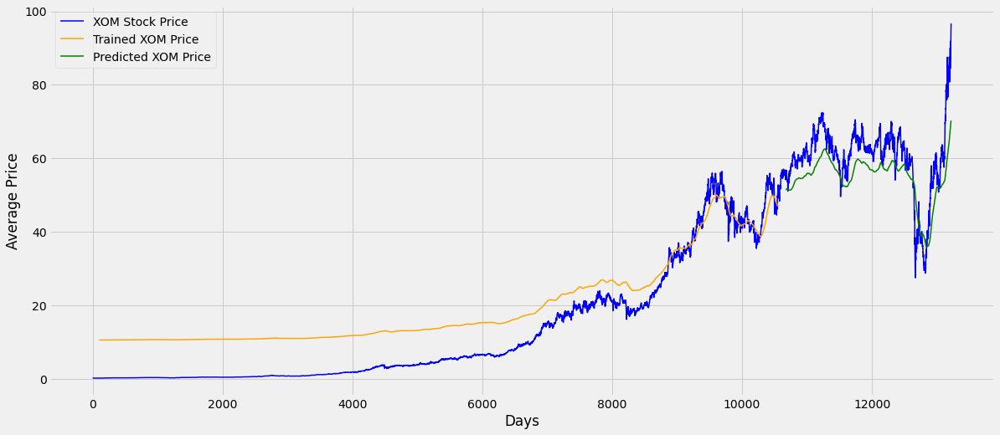

In [30]:
### Plotting 
# shift train predictions for plotting
look_back=100
trainPredictPlot = np.empty_like(XOM_partial_ds1)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict

# shift test predictions for plotting
testPredictPlot = np.empty_like(XOM_partial_ds1)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(XOM_partial_ds1)-1, :] = test_predict

# plot baseline and predictions
plt.figure(figsize=(18,8))
plt.ylabel("Average Price")
plt.xlabel("Days")
plt.plot(scaler.inverse_transform(XOM_partial_ds1),color = 'blue',label = 'XOM Stock Price',linewidth=1.5)
plt.plot(trainPredictPlot, color = 'orange', label = 'Trained XOM Price',linewidth=1.5 )
plt.plot(testPredictPlot, color = 'green', label = 'Predicted XOM Price',linewidth=1.5 )
plt.legend()
plt.show()

In [31]:
len(test_data) #Based on 100 previous days

2644

In [32]:
#Test data from 196-100(Prev 100days),so it starts from 102 day
x_input=test_data[96:].reshape(1,-1)
x_input.shape

(1, 2548)

In [33]:
#Creating list of last 100 data
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

In [34]:
print(len(test_data[96:]))

2548


In [35]:
print(len(temp_input))

2548


In [36]:
actual=XOM_partial_ds1[training_size+101:len(XOM_partial_ds1),:1]
actual=scaler.inverse_transform(actual)

predict=test_predict

In [37]:
print('   Actual                    Predicted')
print('------------------------------------------------')
for i in range(95):
    print(f'{actual[i]}  \t\t {predict[i]} ')

   Actual                    Predicted
------------------------------------------------
[55.84280334]  		 [51.30550565] 
[55.63694712]  		 [51.35240554] 
[56.19898238]  		 [51.40124876] 
[56.59434741]  		 [51.44194838] 
[55.98986633]  		 [51.48384777] 
[56.40321724]  		 [51.51841451] 
[56.36074627]  		 [51.54566863] 
[56.71687538]  		 [51.57543319] 
[56.40484647]  		 [51.60358022] 
[56.15487898]  		 [51.63391781] 
[55.44906964]  		 [51.66060847] 
[55.16643567]  		 [51.6880949] 
[54.7236747]  		 [51.70611573] 
[54.45409373]  		 [51.72428102] 
[54.67294731]  		 [51.7360692] 
[54.63511172]  		 [51.75053889] 
[54.09060771]  		 [51.76418816] 
[53.96559578]  		 [51.77615822] 
[54.13339455]  		 [51.78565272] 
[54.01494031]  		 [51.78855869] 
[53.88990633]  		 [51.78755863] 
[53.73692705]  		 [51.78004881] 
[54.03140843]  		 [51.76859319] 
[53.60696987]  		 [51.7536463] 
[54.18601193]  		 [51.74326611] 
[54.21728028]  		 [51.72939827] 
[54.04454862]  		 [51.7197835] 
[52.94401321]  		 [51.7055